In [2]:
import rawpy

import os, glob, re, json
import numpy as np
import cv2
import matplotlib.pyplot as plt
from typing import List, Tuple

In [10]:
def carregar_imagem(path):
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    if img is None:
        print(f"[aviso] não consegui abrir: {path}")
    return img

def _regex_tail_number(s: str) -> int:
    """
    Extrai um número "útil" do fim do nome para ordenação. 
    Se não encontrar, tenta qualquer número em s; se ainda não, retorna 0.
    """
    base = os.path.basename(s)
    m = re.search(r'(\d+)(?=\D*$)', base)  # último bloco numérico antes do fim
    if m: return int(m.group(1))
    m2 = re.search(r'(\d+)', base)
    return int(m2.group(1)) if m2 else 0

def ordenar_arquivos_imagem(caminho_pasta: str) -> List[str]:
    padroes = ['*.jpg','*.jpeg','*.png','*.bmp','*.tif','*.tiff','*.webp']
    arquivos = []
    for p in padroes:
        arquivos.extend(glob.glob(os.path.join(caminho_pasta, p)))
    arquivos = list(set(arquivos))  # evita duplicados por padrões sobrepostos
    if not arquivos:
        return []
    arquivos.sort(key=lambda f: (_regex_tail_number(f), os.path.basename(f).lower()))
    return arquivos

def serializar_keypoints(kps: List[cv2.KeyPoint]) -> np.ndarray:
    """
    Converte lista de cv2.KeyPoint para array (N,7) -> (x,y,size,angle,response,octave,class_id)
    """
    if not kps:
        return np.zeros((0,7), dtype=np.float32)
    data = np.zeros((len(kps),7), dtype=np.float32)
    for i,k in enumerate(kps):
        data[i,0] = k.pt[0]
        data[i,1] = k.pt[1]
        data[i,2] = k.size
        data[i,3] = k.angle
        data[i,4] = k.response
        data[i,5] = k.octave
        data[i,6] = k.class_id
    return data

def criar_detector(nome: str):
    nome = nome.lower()
    if nome == 'sift':
        return cv2.SIFT_create(), cv2.NORM_L2, 'sift'
    if nome == 'orb':
        return cv2.ORB_create(nfeatures=2000), cv2.NORM_HAMMING, 'orb'
    if nome == 'akaze':
        return cv2.AKAZE_create(), cv2.NORM_HAMMING, 'akaze'
    raise ValueError(f"Detector '{nome}' não reconhecido.")

In [11]:
# --------- ETAPA 2 PRINCIPAL ---------
def analisar_conjunto(caminho_pasta: str, detectores: List[str]):
    """
    Etapa 2: 
    - Extrai e visualiza keypoints/descritores (SIFT/ORB/AKAZE).
    - Salva artefatos para as próximas etapas (.npz por imagem+detector).
    - Gera resumo comparativo (CSV).
    """
    print("=========================================================")
    print(f"Analisando o conjunto de imagens em: '{caminho_pasta}'")
    print("=========================================================")

    # raiz de resultados organizada por pasta e detector
    raiz_resultados = os.path.join("resultados_etapa2", os.path.basename(os.path.normpath(caminho_pasta)))
    os.makedirs(raiz_resultados, exist_ok=True)

    # encontra e ordena imagens
    arquivos_de_imagem = ordenar_arquivos_imagem(caminho_pasta)
    if len(arquivos_de_imagem) < 2:
        print("Erro: São necessárias pelo menos 2 imagens na pasta.")
        return

    # salva a ordem usada (útil para emparelhamentos consecutivos)
    ordem_json = os.path.join(raiz_resultados, "ordem_imagens.json")
    with open(ordem_json, "w", encoding="utf-8") as f:
        json.dump(arquivos_de_imagem, f, indent=2, ensure_ascii=False)
    print(f"-> Ordem das imagens salva em '{ordem_json}'")

    # tabela de resumo (detector, imagem, num_keypoints)
    linhas_resumo = []

    # loop por detector
    for nome_detector in detectores:
        print(f"\n--- Análise para o detector: {nome_detector.upper()} ---")
        try:
            detector, norm_type, detector_slug = criar_detector(nome_detector)
        except ValueError as e:
            print(e)
            continue

        dir_detector = os.path.join(raiz_resultados, detector_slug)
        os.makedirs(dir_detector, exist_ok=True)

        total_keypoints, pares_analisados = 0, 0
        kp_anterior, des_anterior, img_anterior_bgr = None, None, None

        for i, caminho in enumerate(arquivos_de_imagem):
            img_bgr = carregar_imagem(caminho)
            if img_bgr is None:
                continue

            img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
            keypoints, descriptors = detector.detectAndCompute(img_gray, None)
            n_kp = 0 if keypoints is None else len(keypoints)
            total_keypoints += n_kp
            linhas_resumo.append([detector_slug, os.path.basename(caminho), n_kp])

            # salvar features (kps + desc) para Etapas 3-5
            arr_kp = serializar_keypoints(keypoints or [])
            if descriptors is None:
                descriptors = np.zeros((0, detector.descriptorSize() if hasattr(detector, 'descriptorSize') else 0), dtype=np.uint8)
            saida_npz = os.path.join(dir_detector, f"img_{i:03d}_features.npz")
            np.savez_compressed(saida_npz, keypoints=arr_kp, descriptors=descriptors, imagem_absoluta=caminho)
            # overlay de keypoints
            img_kp = cv2.drawKeypoints(img_gray, keypoints or [], None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
            saida_overlay = os.path.join(dir_detector, f"img_{i:03d}_keypoints.jpg")
            cv2.imwrite(saida_overlay, img_kp)

            if i == 0:
                # preview no notebook da 1ª imagem (RGB para plot)
                plt.figure(figsize=(12, 8))
                plt.imshow(img_kp, cmap='gray')
                plt.title(f'Keypoints ({detector_slug.upper()}) em {os.path.basename(caminho)}')
                plt.axis('off')
                plt.show()

            # preview de matches só no primeiro par (sem filtro — apenas visual)
            if i > 0 and des_anterior is not None and descriptors is not None and len(des_anterior) > 0 and len(descriptors) > 0:
                bf = cv2.BFMatcher(norm_type, crossCheck=True)
                matches = bf.match(des_anterior, descriptors)
                matches = sorted(matches, key=lambda x: x.distance)
                pares_analisados += 1

                if i == 1:
                    preview = cv2.drawMatches(img_anterior_bgr, kp_anterior or [],
                                              img_bgr, keypoints or [],
                                              matches[:75], None,
                                              flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
                    saida_match = os.path.join(dir_detector, f"preview_matches_par_0-1.jpg")
                    cv2.imwrite(saida_match, preview)
                    plt.figure(figsize=(20, 10))
                    plt.imshow(cv2.cvtColor(preview, cv2.COLOR_BGR2RGB))
                    plt.title(f'Top 75 Matches (preview) — {detector_slug.upper()} — img_000 ↔ img_001')
                    plt.axis('off')
                    plt.show()

            kp_anterior, des_anterior, img_anterior_bgr = keypoints, descriptors, img_bgr

        media_kp = total_keypoints / len(arquivos_de_imagem)
        print("\n--- Resumo Estatístico ---")
        print(f"Média de keypoints por imagem ({detector_slug}): {media_kp:.2f}")

    # salva CSV de resumo
    import csv
    csv_path = os.path.join(raiz_resultados, "resumo_keypoints.csv")
    with open(csv_path, "w", newline="", encoding="utf-8") as f:
        w = csv.writer(f)
        w.writerow(["detector","imagem","num_keypoints"])
        w.writerows(linhas_resumo)
    print(f"\n-> Resumo salvo em '{csv_path}'")

    # Dica rápida de comparação para o relatório:
    # Você pode carregar o CSV no pandas e fazer médias por detector.

Analisando o conjunto de imagens em: 'images-normal'
-> Ordem das imagens salva em 'resultados_etapa2/images-normal/ordem_imagens.json'

--- Análise para o detector: SIFT ---


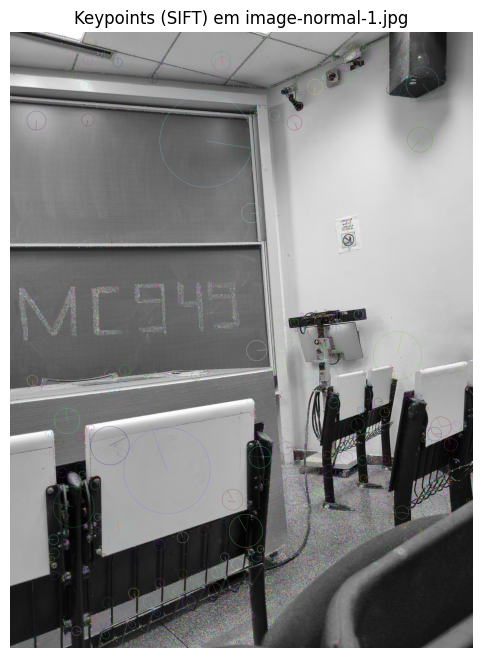

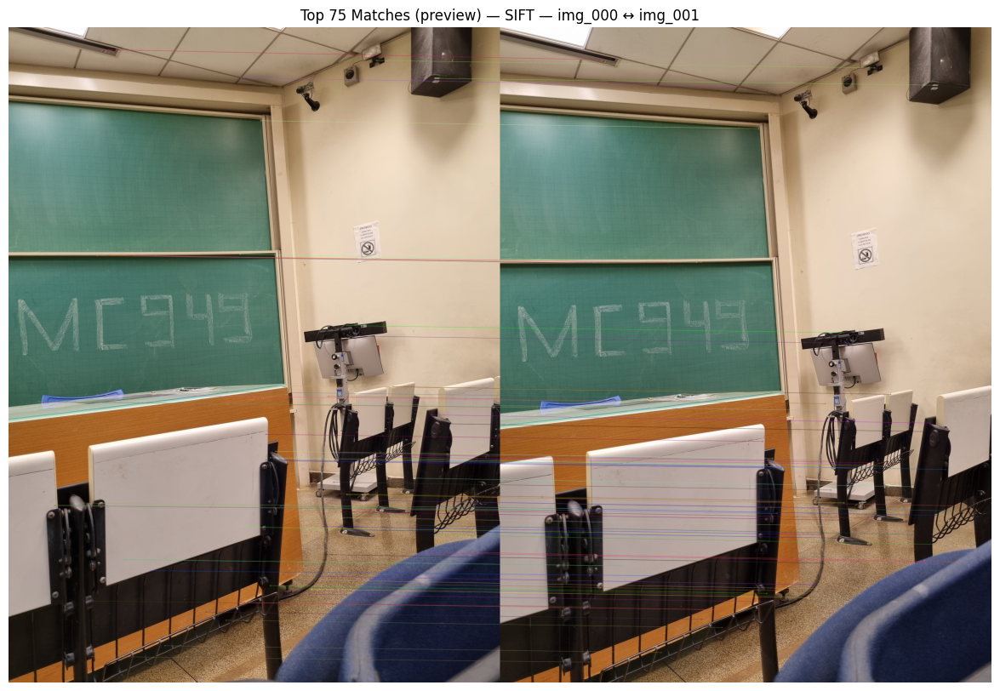


--- Resumo Estatístico ---
Média de keypoints por imagem (sift): 16123.21

--- Análise para o detector: ORB ---


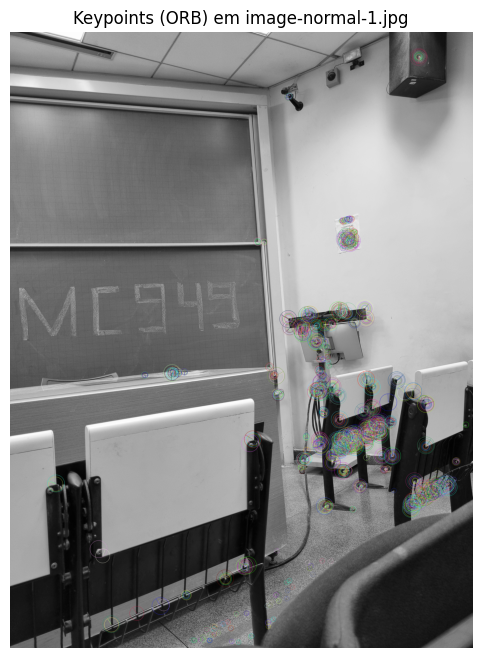

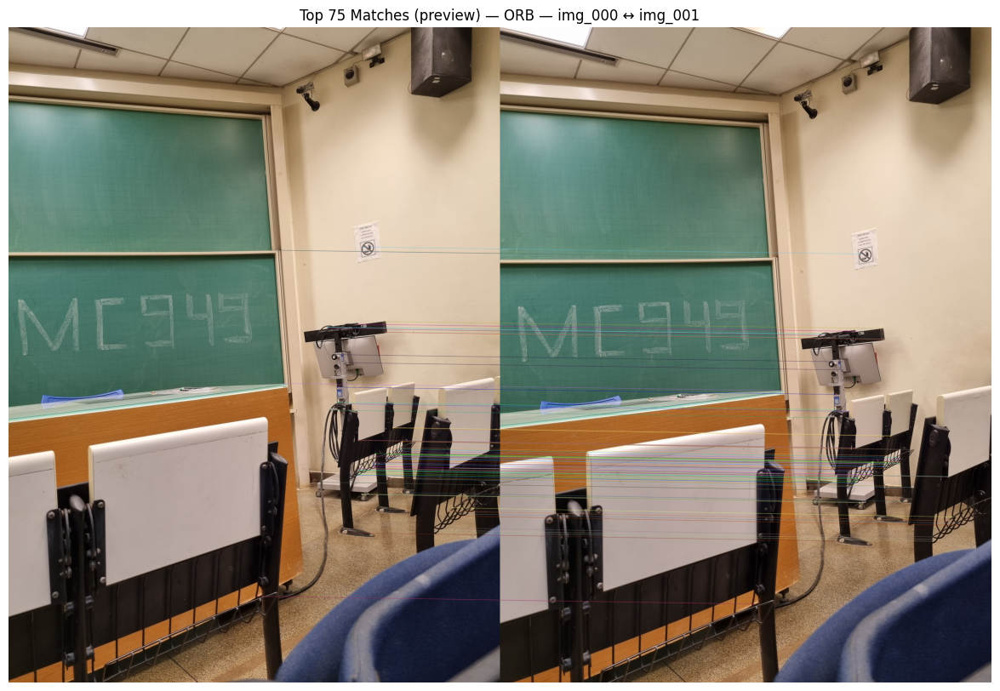


--- Resumo Estatístico ---
Média de keypoints por imagem (orb): 2000.00

--- Análise para o detector: AKAZE ---


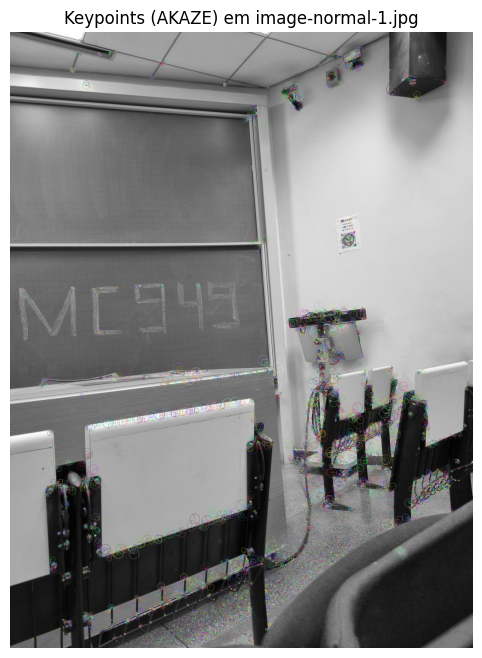

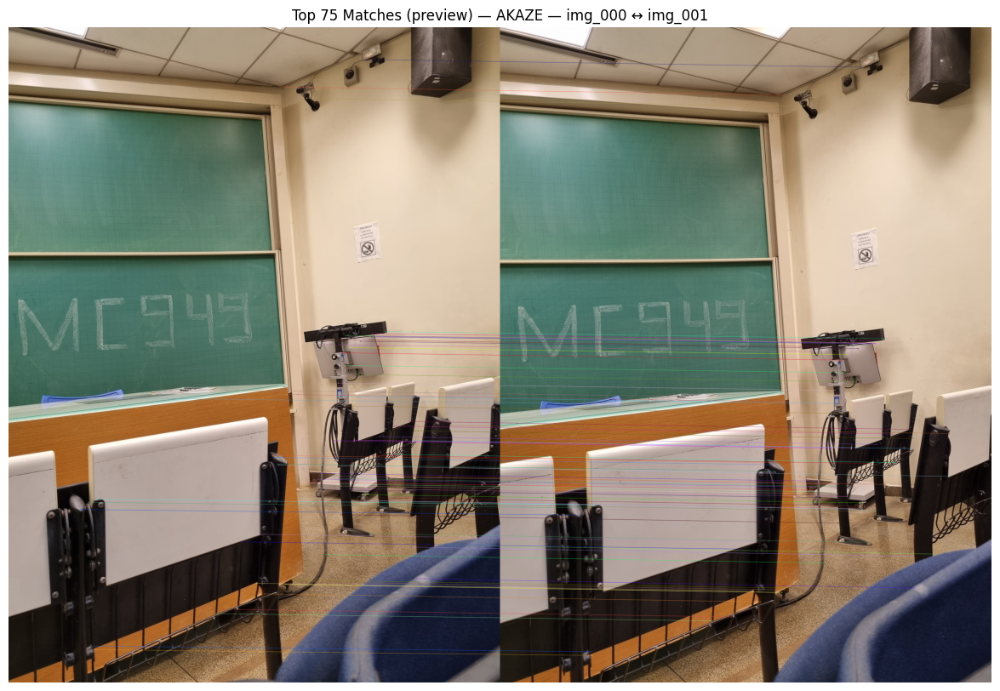


--- Resumo Estatístico ---
Média de keypoints por imagem (akaze): 3888.69

-> Resumo salvo em 'resultados_etapa2/images-normal/resumo_keypoints.csv'


In [4]:
caminho_normal = "images-normal"
detectores = ['sift', 'orb', 'akaze']
analisar_conjunto(caminho_normal, detectores)

Analisando o conjunto de imagens em: 'images-pro'
-> Ordem das imagens salva em 'resultados_etapa2/images-pro/ordem_imagens.json'

--- Análise para o detector: SIFT ---


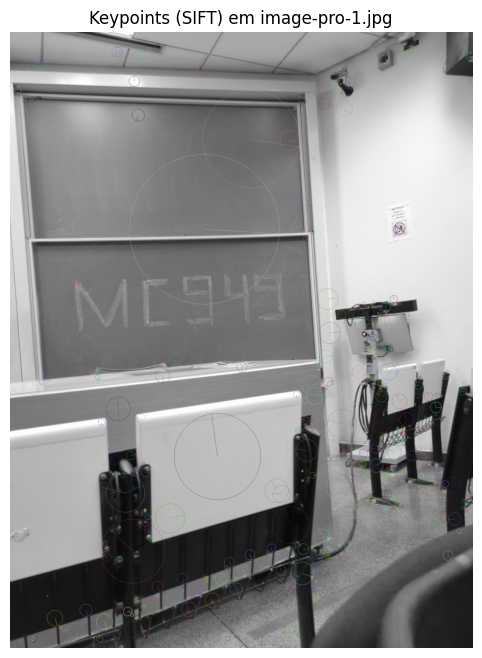

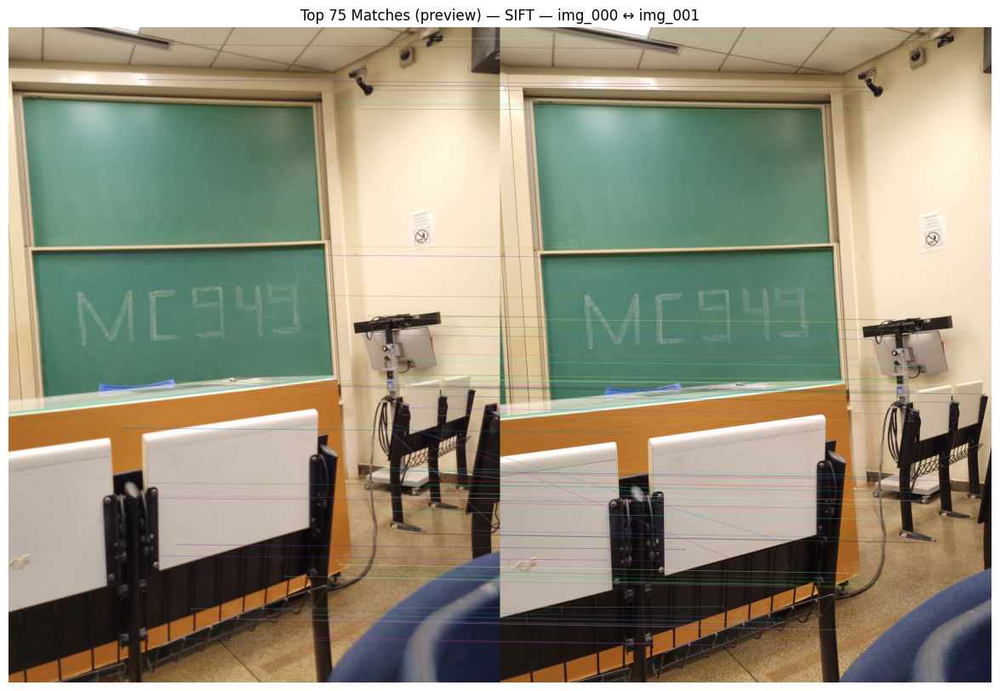


--- Resumo Estatístico ---
Média de keypoints por imagem (sift): 10800.50

--- Análise para o detector: ORB ---


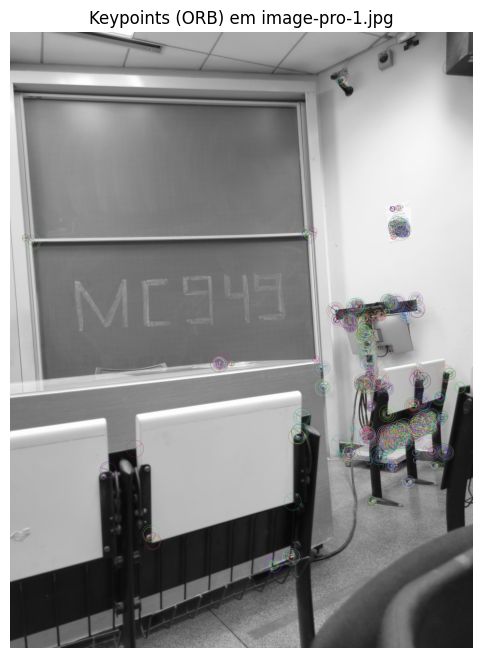

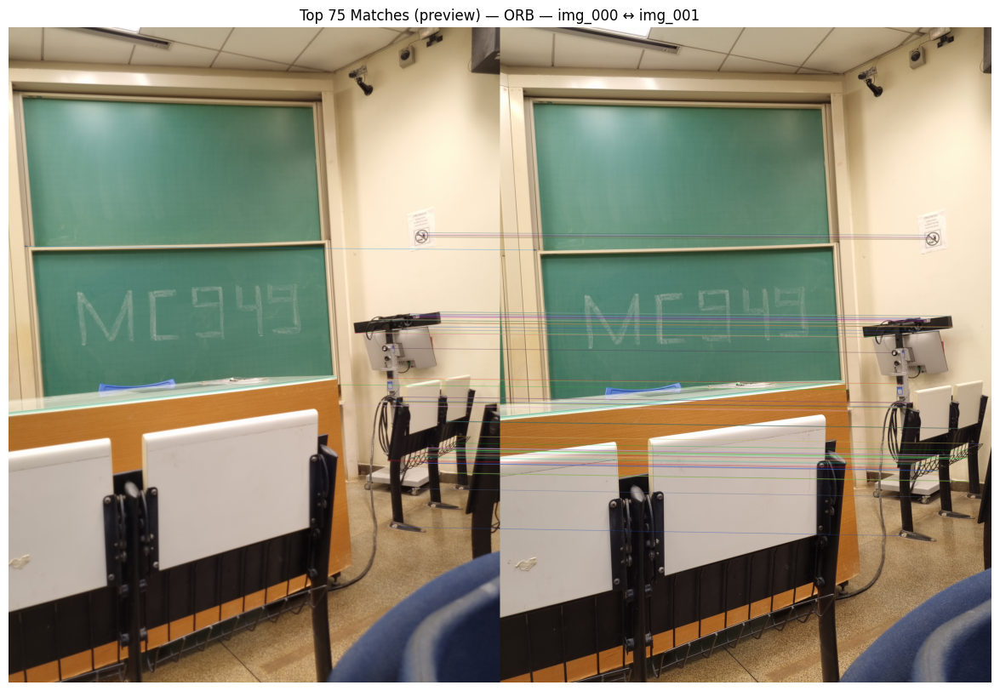


--- Resumo Estatístico ---
Média de keypoints por imagem (orb): 2000.00

--- Análise para o detector: AKAZE ---


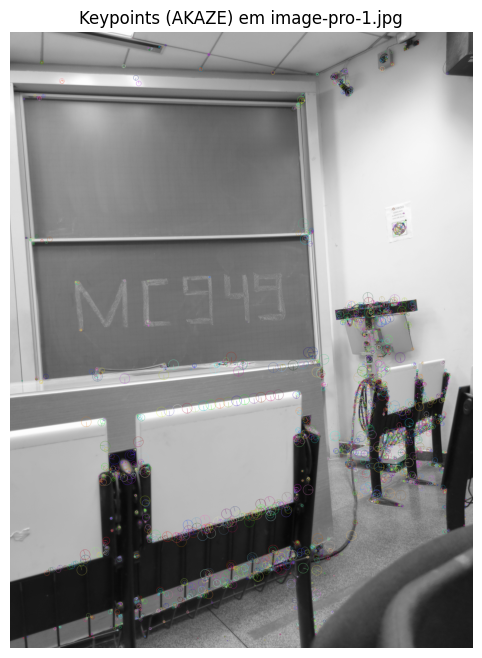

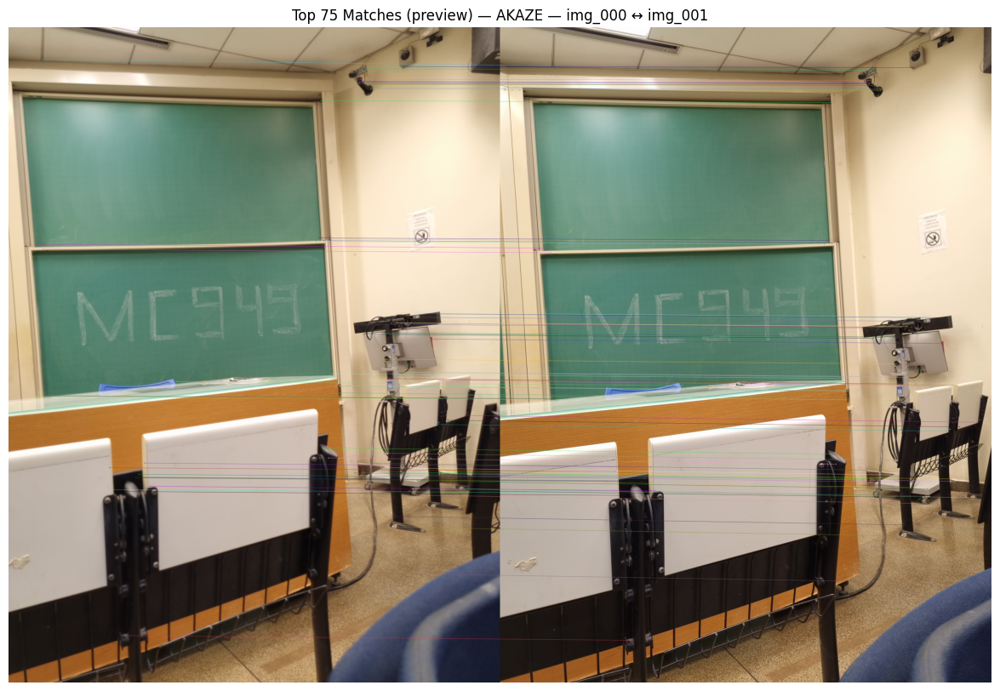


--- Resumo Estatístico ---
Média de keypoints por imagem (akaze): 3441.05

-> Resumo salvo em 'resultados_etapa2/images-pro/resumo_keypoints.csv'


In [14]:
caminho_pro = "images-pro"
detectores = ['sift', 'orb', 'akaze']
analisar_conjunto(caminho_pro, detectores)

In [ ]:
caminho_raw = "images-developed-png-8bit"
detectores = ['sift', 'orb', 'akaze']
analisar_conjunto(caminho_raw, detectores)

In [ ]:
caminho_raw = "images-developed-png-16bit"
detectores = ['sift', 'orb', 'akaze']
analisar_conjunto(caminho_raw, detectores)

In [ ]:
caminho_raw = "images-developed-tiff-8bit"
detectores = ['sift', 'orb', 'akaze']
analisar_conjunto(caminho_raw, detectores)

In [ ]:
caminho_raw = "images-developed-tiff-16bit"
detectores = ['sift', 'orb', 'akaze']
analisar_conjunto(caminho_raw, detectores)

In [12]:
def desserializar_keypoints(arr: np.ndarray) -> List[cv2.KeyPoint]:
    """
    Reconstrói lista de cv2.KeyPoint a partir do array (N,7).
    """
    kps = []
    for row in arr:
        # (x,y,size,angle,response,octave,class_id)
        k = cv2.KeyPoint(
            x=float(row[0]),
            y=float(row[1]),
            size=float(row[2]),
            angle=float(row[3]),
            response=float(row[4]),
            octave=int(row[5]),
            class_id=int(row[6])
        )
        kps.append(k)
    return kps

# --------- Etapa 3+ ---------
def carregar_features_npz(caminho_npz: str) -> Tuple[List[cv2.KeyPoint], np.ndarray, str]:
    """
    Lê um .npz salvo pela Etapa 2 e retorna (keypoints, descriptors, imagem_absoluta).
    """
    data = np.load(caminho_npz, allow_pickle=True)
    kps = desserializar_keypoints(data["keypoints"])
    desc = data["descriptors"]
    img_path = str(data["imagem_absoluta"])
    return kps, desc, img_path

In [ ]:
# teste
kps1, desc1, path1 = carregar_features_npz("resultados_etapa2/images-normal/sift/img_000_features.npz")
print(len(kps1), desc1.shape, path1)

30754 (30754, 128) images-normal/image-normal-1.jpg
